In [142]:
import torch
import torchvision
import numpy as np
import matplotlib.pylab as plt
from PIL import Image

models_list = []
for m in dir(torchvision.models):
    try:
        mod = getattr(torchvision.models, m)
        print(m, mod.model_urls)
        for k in mod.model_urls:
            mod.model_urls[k] = mod.model_urls[k].replace('https://', 'http://') 
            models_list.append(k)
    except:
        print('passing', m)
        pass

print('completed for:', models_list)

passing AlexNet
passing DenseNet
passing Inception3
passing ResNet
passing SqueezeNet
passing VGG
passing __builtins__
passing __cached__
passing __doc__
passing __file__
passing __loader__
passing __name__
passing __package__
passing __path__
passing __spec__
passing alexnet
densenet {'densenet121': 'http://download.pytorch.org/models/densenet121-a639ec97.pth', 'densenet169': 'http://download.pytorch.org/models/densenet169-b2777c0a.pth', 'densenet201': 'http://download.pytorch.org/models/densenet201-c1103571.pth', 'densenet161': 'http://download.pytorch.org/models/densenet161-8d451a50.pth'}
passing densenet121
passing densenet161
passing densenet169
passing densenet201
inception {'inception_v3_google': 'http://download.pytorch.org/models/inception_v3_google-1a9a5a14.pth'}
passing inception_v3
resnet {'resnet18': 'http://download.pytorch.org/models/resnet18-5c106cde.pth', 'resnet34': 'http://download.pytorch.org/models/resnet34-333f7ec4.pth', 'resnet50': 'http://download.pytorch.org/mo

In [2]:
models_archs = []
for m in models_list:
    try:
        mod = getattr(torchvision.models, m)
        models_archs.append(mod(pretrained=True).cuda())
        print('loading', m)  
    except:
        pass

loading resnet18
loading resnet34
loading resnet50
loading resnet101
loading resnet152
loading squeezenet1_0


/opt/oss-mldl/lib/python3.6/site-packages/torchvision/models/squeezenet.py:94: UserWarning: nn.init.kaiming_uniform is now deprecated in favor of nn.init.kaiming_uniform_.
  init.kaiming_uniform(m.weight.data)
/opt/oss-mldl/lib/python3.6/site-packages/torchvision/models/squeezenet.py:92: UserWarning: nn.init.normal is now deprecated in favor of nn.init.normal_.
  init.normal(m.weight.data, mean=0.0, std=0.01)


loading squeezenet1_1
loading vgg11
loading vgg13
loading vgg16
loading vgg19
loading vgg11_bn
loading vgg13_bn
loading vgg16_bn
loading vgg19_bn


850 500
torch.Size([3, 500, 850])


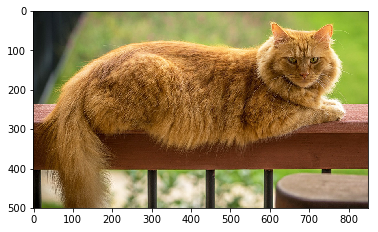

min & max tensor(0.) tensor(1.)
min & max tensor(-2.1179) tensor(2.6400)
min & max tensor(-11.3664) tensor(9.9289)
min & max tensor(-2.1179) tensor(2.6400)
min & max tensor(0.) tensor(1.0000)


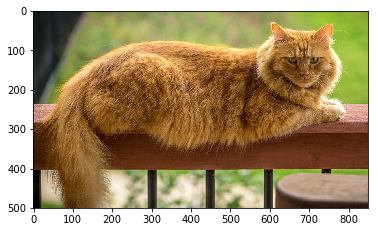

In [182]:
normalize = torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

cat_in = Image.open('/razavianlab/torchdata/samples/large-breed.jpg')
print(cat_in.width, cat_in.height)
cat_res = torchvision.transforms.ToTensor()(cat_in)
print(cat_res.size())
plt.imshow(cat_res.numpy().transpose(1,2,0)); plt.show()
print('min & max', cat_res.min(), cat_res.max())
cat_res = normalize(cat_res)
print('min & max', cat_res.min(), cat_res.max())
cat_res = normalize(cat_res)
print('min & max', cat_res.min(), cat_res.max())
cat_res = unnormalize(cat_res)
print('min & max', cat_res.min(), cat_res.max())
cat_res = unnormalize(cat_res)
print('min & max', cat_res.min(), cat_res.max())
plt.imshow(cat_res.numpy().transpose(1,2,0)); plt.show()

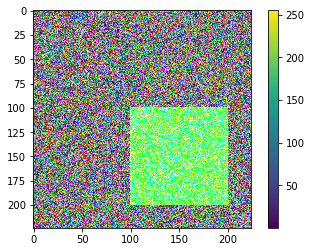

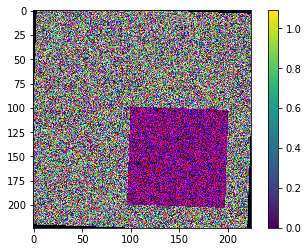

In [187]:
augment = torchvision.transforms.Compose([
    torchvision.transforms.ToPILImage(),
    torchvision.transforms.RandomRotation(2),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
    
gray_input = torch.rand(1, 3, 224, 224)* 255
gray_input[:, 1:2 ,100:200,100:200] = 1.0
plt.imshow(np.squeeze(gray_input.numpy().transpose((0,2,3,1)), axis=0)); plt.colorbar(); plt.show()

gray_input[0,:,:,:] = augment(gray_input.squeeze())
plt.imshow(np.squeeze(unnormalize(gray_input).numpy().transpose((0,2,3,1)), axis=0)); plt.colorbar(); plt.show()

In [188]:
class_labels = eval(open('/razavianlab/torchdata/imagenet/imagenet1000_clsid_to_human.txt','r').read())
print(class_labels[0])

tench, Tinca tinca


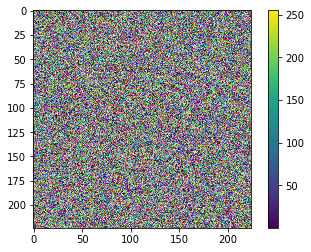

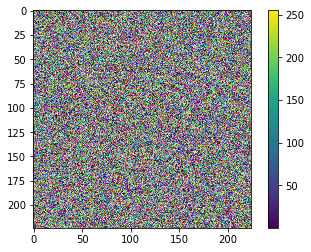

In [189]:
def unnormalize(tensor, meanarr=(0.485, 0.456, 0.406), stdarr=(0.229, 0.224, 0.225)):
    for t, m, s in zip(tensor, meanarr, stdarr):
        t.mul_(s).add_(m)
    return tensor

def normalize_cust(tensor, meanarr=(0.485, 0.456, 0.406), stdarr=(0.229, 0.224, 0.225)):
    for t, m, s in zip(tensor, meanarr, stdarr):
        t.sub_(m).div_(s)
    return tensor

gray_input = torch.rand(10, 3, 224, 224)* 255
gray_input_norm = normalize_cust(gray_input)
gray_input_denorm = unnormalize(gray_input_norm)

plt.imshow(gray_input.numpy().transpose((0,2,3,1))[0,:,:,:]); plt.colorbar(); plt.show()
plt.imshow(gray_input_denorm.numpy().transpose((0,2,3,1))[0,:,:,:]); plt.colorbar(); plt.show()


In [190]:
def plot_tensor(t):
    try:
        plt.imshow(np.clip(t.numpy().transpose((0,2,3,1))[0,:,:,:], 0,255))
        plt.colorbar()
        plt.show()
    except:
        pass

def plot_tensorVar(t):
    try:
        plt.imshow(np.clip(t.cpu().data.numpy().transpose((0,2,3,1))[0,:,:,:], 0, 255))
        plt.colorbar()
        plt.show()
    except:
        pass

def visualize(models_archs, class_id=333):
    print('class to be:', class_labels[class_id])
    gray_input = torch.rand(1, 3, 224, 224) * 225
    print('initial blank image:')
    plot_tensor(gray_input)
    gray_input = torch.autograd.Variable(gray_input.cuda(), requires_grad = True)
    desired_class = torch.autograd.Variable(torch.LongTensor([class_id]), requires_grad = False).cuda()
    criterion = torch.nn.CrossEntropyLoss().cuda()
    optimizer = torch.optim.SGD([gray_input], lr=1e-1)

    desired_nll = []
    for mod in models_archs:
        mod.eval()
        params = mod.parameters()
        for param in params:
            param.require_grad = False
        
    for epoch in range(10000):
        # print(epoch)
        for mod in models_archs:
            gray_input.data[0,:,:,:] = augment(torch.squeeze(gray_input.data.cpu())).cuda()
            output = mod(gray_input)
            preds, idx = torch.topk(output, k=5, dim=1)
            desired_nll.append(output[0,333].item())
            if epoch % 100 == 0:
                print(mod.__class__)
                print('pre-softmax-nll-score for:', class_labels[class_id], ':', desired_nll[-1])                
                for i, p in zip(idx.tolist()[0], preds.data.tolist()[0]):
                    print(i,'(', class_labels[i], ') pre-softmax-nll-score:', p)
            loss = criterion(output, desired_class) #grad, = torch.autograd.grad(loss, gray_input)
            loss.backward()
            optimizer.step() #gray_input.data += -0.1 * grad.data
            gray_input.data = unnormalize(gray_input.data)
        if epoch % 100 == 0:
            plt.plot(desired_nll); plt.show()
            plot_tensorVar(gray_input)
        
    return gray_input.data.numpy()


class to be: hamster
initial blank image:


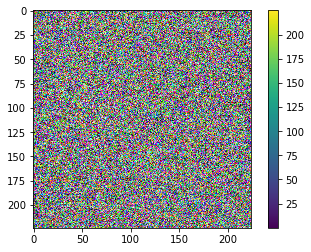

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.18897904455661774
107 ( jellyfish ) pre-softmax-nll-score: 8.191804885864258
971 ( bubble ) pre-softmax-nll-score: 6.678276538848877
611 ( jigsaw puzzle ) pre-softmax-nll-score: 6.370552062988281
562 ( fountain ) pre-softmax-nll-score: 5.816815376281738
4 ( hammerhead, hammerhead shark ) pre-softmax-nll-score: 5.312932014465332
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.5277830958366394
599 ( honeycomb ) pre-softmax-nll-score: 8.387957572937012
794 ( shower curtain ) pre-softmax-nll-score: 7.672773361206055
854 ( theater curtain, theatre curtain ) pre-softmax-nll-score: 6.5883469581604
971 ( bubble ) pre-softmax-nll-score: 6.518182754516602
904 ( window screen ) pre-softmax-nll-score: 6.506790637969971
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -1.996005892753601
904 ( window screen ) pre-softmax-nll-score: 9.023193359375
490 ( ch

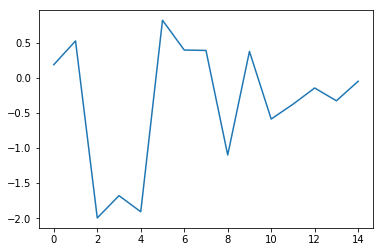

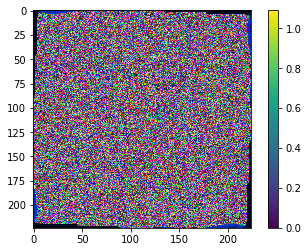

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.474981427192688
971 ( bubble ) pre-softmax-nll-score: 6.610257148742676
539 ( doormat, welcome mat ) pre-softmax-nll-score: 6.547835350036621
898 ( water bottle ) pre-softmax-nll-score: 6.530319690704346
637 ( mailbox, letter box ) pre-softmax-nll-score: 6.271782875061035
562 ( fountain ) pre-softmax-nll-score: 5.8989033699035645
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -0.7339311242103577
664 ( monitor ) pre-softmax-nll-score: 7.307085037231445
782 ( screen, CRT screen ) pre-softmax-nll-score: 6.827530384063721
971 ( bubble ) pre-softmax-nll-score: 6.544921875
898 ( water bottle ) pre-softmax-nll-score: 5.88765811920166
851 ( television, television system ) pre-softmax-nll-score: 5.724843978881836
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -1.9308120012283325
851 ( television, television system ) pre-softmax-nll-score: 7.94531345

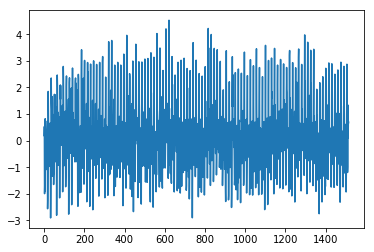

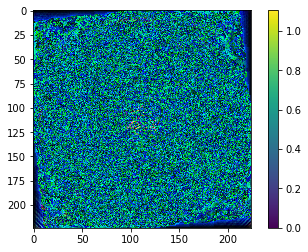

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.6017164587974548
637 ( mailbox, letter box ) pre-softmax-nll-score: 7.955735206604004
898 ( water bottle ) pre-softmax-nll-score: 7.373974800109863
885 ( velvet ) pre-softmax-nll-score: 7.2257561683654785
792 ( shovel ) pre-softmax-nll-score: 7.05334997177124
559 ( folding chair ) pre-softmax-nll-score: 6.828507900238037
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.6398459672927856
971 ( bubble ) pre-softmax-nll-score: 7.344441890716553
664 ( monitor ) pre-softmax-nll-score: 6.893126487731934
782 ( screen, CRT screen ) pre-softmax-nll-score: 6.814890384674072
741 ( prayer rug, prayer mat ) pre-softmax-nll-score: 6.663947105407715
620 ( laptop, laptop computer ) pre-softmax-nll-score: 6.223996639251709
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -1.761755347251892
792 ( shovel ) pre-softmax-nll-score: 7.272902965545654
574 ( golf ball

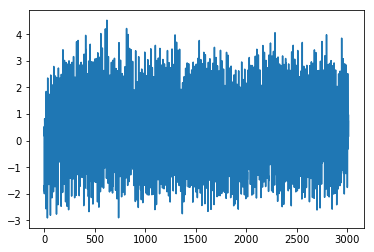

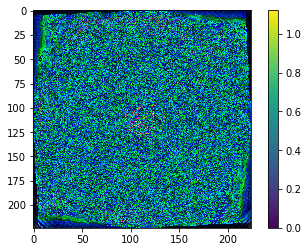

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 1.0210975408554077
898 ( water bottle ) pre-softmax-nll-score: 8.283767700195312
851 ( television, television system ) pre-softmax-nll-score: 7.491906642913818
782 ( screen, CRT screen ) pre-softmax-nll-score: 7.175240516662598
619 ( lampshade, lamp shade ) pre-softmax-nll-score: 7.1688408851623535
971 ( bubble ) pre-softmax-nll-score: 7.0447611808776855
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -0.08083118498325348
664 ( monitor ) pre-softmax-nll-score: 7.189971923828125
782 ( screen, CRT screen ) pre-softmax-nll-score: 6.977337837219238
971 ( bubble ) pre-softmax-nll-score: 6.75035285949707
851 ( television, television system ) pre-softmax-nll-score: 6.506415367126465
893 ( wallet, billfold, notecase, pocketbook ) pre-softmax-nll-score: 6.1319780349731445
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -1.331169843673706
851 ( televisio

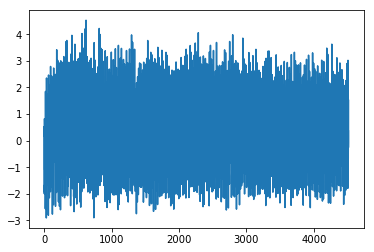

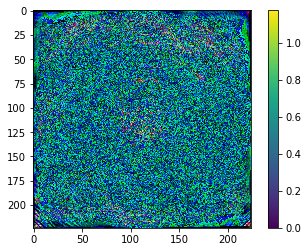

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.6350238919258118
885 ( velvet ) pre-softmax-nll-score: 7.857395172119141
735 ( poncho ) pre-softmax-nll-score: 7.606314182281494
898 ( water bottle ) pre-softmax-nll-score: 7.492652416229248
879 ( umbrella ) pre-softmax-nll-score: 7.383176803588867
636 ( mailbag, postbag ) pre-softmax-nll-score: 7.306163787841797
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 1.1434458494186401
971 ( bubble ) pre-softmax-nll-score: 8.493000984191895
794 ( shower curtain ) pre-softmax-nll-score: 6.749963760375977
885 ( velvet ) pre-softmax-nll-score: 6.743092060089111
854 ( theater curtain, theatre curtain ) pre-softmax-nll-score: 6.54823112487793
599 ( honeycomb ) pre-softmax-nll-score: 6.46728515625
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -1.6926443576812744
792 ( shovel ) pre-softmax-nll-score: 7.611173152923584
882 ( vacuum, vacuum cleaner ) pre-s

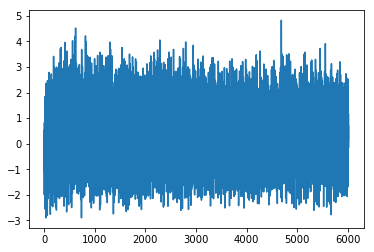

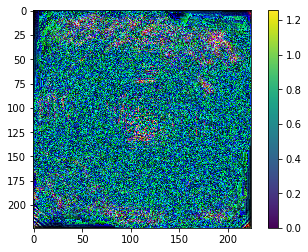

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.9017903804779053
851 ( television, television system ) pre-softmax-nll-score: 7.074615478515625
898 ( water bottle ) pre-softmax-nll-score: 7.023382186889648
636 ( mailbag, postbag ) pre-softmax-nll-score: 6.701845169067383
885 ( velvet ) pre-softmax-nll-score: 6.575218200683594
782 ( screen, CRT screen ) pre-softmax-nll-score: 6.544551372528076
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 1.3113068342208862
971 ( bubble ) pre-softmax-nll-score: 6.462451934814453
84 ( peacock ) pre-softmax-nll-score: 5.497665882110596
741 ( prayer rug, prayer mat ) pre-softmax-nll-score: 5.340071678161621
868 ( tray ) pre-softmax-nll-score: 4.765064239501953
696 ( paintbrush ) pre-softmax-nll-score: 4.725662708282471
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.03551309555768967
851 ( television, television system ) pre-softmax-nll-score: 8.5907783508

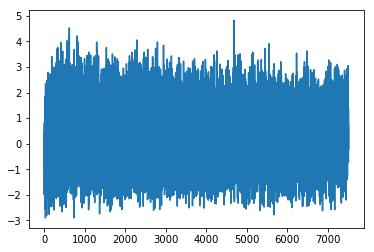

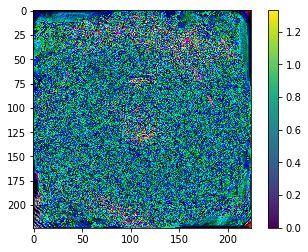

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 1.2234067916870117
885 ( velvet ) pre-softmax-nll-score: 6.771596908569336
824 ( stole ) pre-softmax-nll-score: 6.655056476593018
735 ( poncho ) pre-softmax-nll-score: 6.4788737297058105
741 ( prayer rug, prayer mat ) pre-softmax-nll-score: 6.436229705810547
971 ( bubble ) pre-softmax-nll-score: 6.362307548522949
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 1.733981966972351
971 ( bubble ) pre-softmax-nll-score: 8.216835021972656
84 ( peacock ) pre-softmax-nll-score: 6.90843391418457
109 ( brain coral ) pre-softmax-nll-score: 6.823277950286865
973 ( coral reef ) pre-softmax-nll-score: 6.814925193786621
107 ( jellyfish ) pre-softmax-nll-score: 6.695644378662109
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : -1.0019794702529907
851 ( television, television system ) pre-softmax-nll-score: 7.971642971038818
782 ( screen, CRT screen ) pre-softma

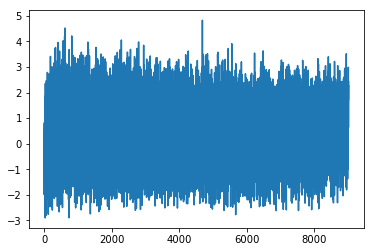

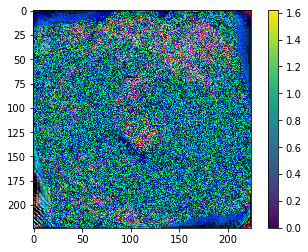

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 1.2283111810684204
971 ( bubble ) pre-softmax-nll-score: 6.863243579864502
741 ( prayer rug, prayer mat ) pre-softmax-nll-score: 5.735674858093262
646 ( maze, labyrinth ) pre-softmax-nll-score: 5.712154388427734
390 ( eel ) pre-softmax-nll-score: 5.4929304122924805
637 ( mailbox, letter box ) pre-softmax-nll-score: 5.460181713104248
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 3.149254083633423
971 ( bubble ) pre-softmax-nll-score: 7.254300117492676
393 ( anemone fish ) pre-softmax-nll-score: 6.951837539672852
973 ( coral reef ) pre-softmax-nll-score: 6.672379493713379
109 ( brain coral ) pre-softmax-nll-score: 6.611705303192139
819 ( stage ) pre-softmax-nll-score: 6.479912757873535
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 0.4701961576938629
792 ( shovel ) pre-softmax-nll-score: 6.995930194854736
6 ( stingray ) pre-softmax-nll-score: 

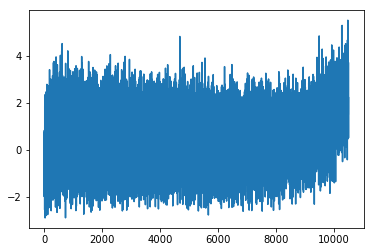

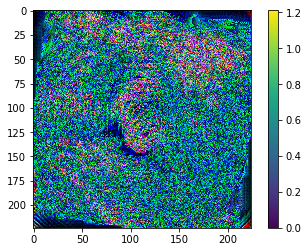

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 2.830993413925171
637 ( mailbox, letter box ) pre-softmax-nll-score: 6.281725883483887
412 ( ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin ) pre-softmax-nll-score: 6.260503768920898
646 ( maze, labyrinth ) pre-softmax-nll-score: 6.075005054473877
463 ( bucket, pail ) pre-softmax-nll-score: 6.018932819366455
390 ( eel ) pre-softmax-nll-score: 5.586422443389893
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 4.332925796508789
971 ( bubble ) pre-softmax-nll-score: 8.054520606994629
203 ( West Highland white terrier ) pre-softmax-nll-score: 7.7066473960876465
184 ( Irish terrier ) pre-softmax-nll-score: 7.701414585113525
611 ( jigsaw puzzle ) pre-softmax-nll-score: 7.509863376617432
183 ( Kerry blue terrier ) pre-softmax-nll-score: 7.065040111541748
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster

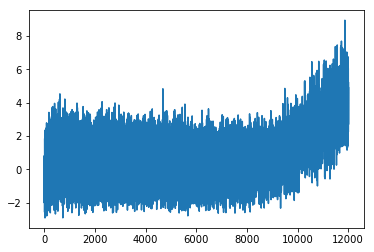

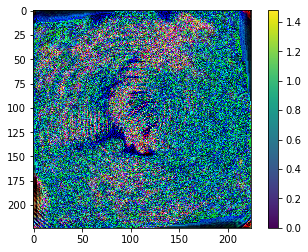

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 3.907135486602783
463 ( bucket, pail ) pre-softmax-nll-score: 5.8272223472595215
84 ( peacock ) pre-softmax-nll-score: 5.7367844581604
412 ( ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin ) pre-softmax-nll-score: 5.240332126617432
792 ( shovel ) pre-softmax-nll-score: 5.218020915985107
845 ( syringe ) pre-softmax-nll-score: 5.1812052726745605
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.997892379760742
333 ( hamster ) pre-softmax-nll-score: 10.997892379760742
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.17499828338623
611 ( jigsaw puzzle ) pre-softmax-nll-score: 7.284154415130615
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 6.993293762207031
741 ( prayer rug, prayer mat ) pre-softmax-nll-score: 6.991535186767578
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 6.8

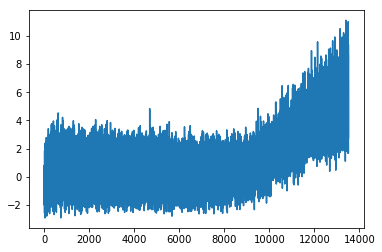

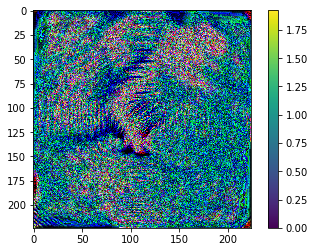

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 5.573938846588135
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.801979064941406
362 ( badger ) pre-softmax-nll-score: 7.660207271575928
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 7.3350605964660645
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.154126167297363
84 ( peacock ) pre-softmax-nll-score: 6.482752799987793
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.25865650177002
333 ( hamster ) pre-softmax-nll-score: 9.25865650177002
937 ( broccoli ) pre-softmax-nll-score: 7.9594502449035645
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.714900493621826
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.319718837738037
973 ( coral reef ) pre-softmax-nll-score: 6.988554954528809
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.111419677734375
333 ( hamster ) pre-softmax-nll-score: 10.111419677734375

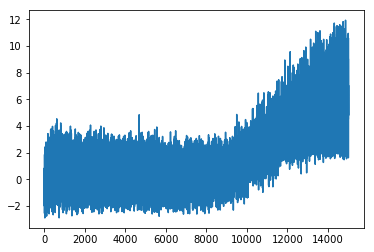

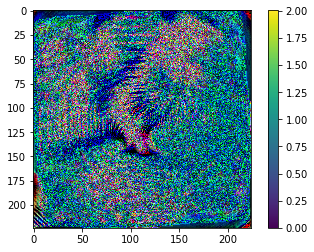

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 4.5682549476623535
84 ( peacock ) pre-softmax-nll-score: 6.531747817993164
362 ( badger ) pre-softmax-nll-score: 6.338459491729736
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 6.122577667236328
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 5.579094886779785
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 5.5523881912231445
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.378729820251465
333 ( hamster ) pre-softmax-nll-score: 11.378729820251465
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.299027442932129
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.831969261169434
356 ( weasel ) pre-softmax-nll-score: 7.074741363525391
106 ( wombat ) pre-softmax-nll-score: 6.964998722076416
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 7.880733489990234
106 ( wombat ) pre-softmax-nll-score: 9.147940635681152
336

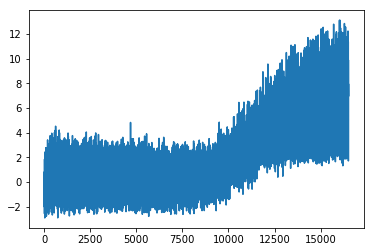

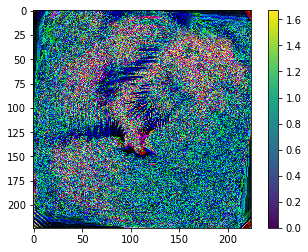

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 5.607553482055664
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 6.165890216827393
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 5.9135541915893555
333 ( hamster ) pre-softmax-nll-score: 5.607553482055664
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 5.46165132522583
971 ( bubble ) pre-softmax-nll-score: 5.377764701843262
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.701618194580078
333 ( hamster ) pre-softmax-nll-score: 10.701618194580078
107 ( jellyfish ) pre-softmax-nll-score: 8.213881492614746
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.953447341918945
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.578573226928711
284 ( Siamese cat, Siamese ) pre-softmax-nll-score: 6.851244926452637
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.343249320983887
333 ( hamster ) pre-softmax-nll-score:

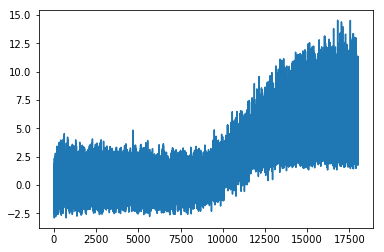

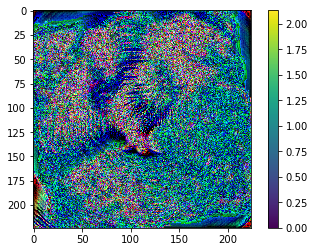

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 5.8281755447387695
362 ( badger ) pre-softmax-nll-score: 7.27380895614624
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 7.0331525802612305
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 6.837158679962158
356 ( weasel ) pre-softmax-nll-score: 6.494565963745117
337 ( beaver ) pre-softmax-nll-score: 6.4311065673828125
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.172385215759277
333 ( hamster ) pre-softmax-nll-score: 12.172385215759277
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.72658634185791
937 ( broccoli ) pre-softmax-nll-score: 7.865372657775879
107 ( jellyfish ) pre-softmax-nll-score: 7.701891899108887
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.3271565437316895
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.204388618469238
333 ( hamster ) pre-softmax-nll-score: 11.204388618469238
106 ( wom

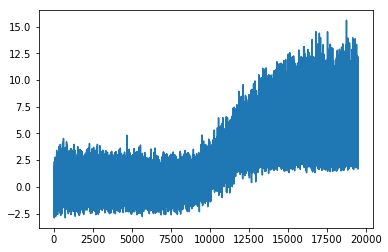

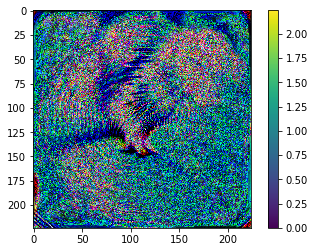

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 5.595398902893066
328 ( sea urchin ) pre-softmax-nll-score: 5.96087646484375
552 ( feather boa, boa ) pre-softmax-nll-score: 5.945947647094727
84 ( peacock ) pre-softmax-nll-score: 5.813464641571045
333 ( hamster ) pre-softmax-nll-score: 5.595398902893066
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 5.4776434898376465
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.956853866577148
333 ( hamster ) pre-softmax-nll-score: 10.956853866577148
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.444502830505371
937 ( broccoli ) pre-softmax-nll-score: 7.428399562835693
284 ( Siamese cat, Siamese ) pre-softmax-nll-score: 6.768520832061768
106 ( wombat ) pre-softmax-nll-score: 6.61288595199585
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.700794219970703
333 ( hamster ) pre-softmax-nll-score: 9.700794219970703
106 ( wombat ) pre-s

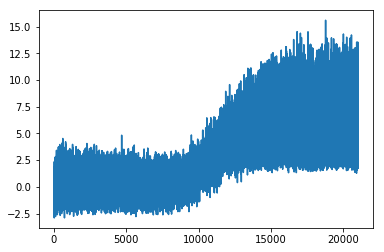

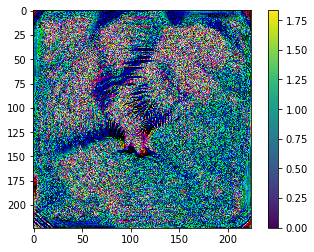

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 6.04319429397583
362 ( badger ) pre-softmax-nll-score: 6.624224662780762
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 6.347688674926758
106 ( wombat ) pre-softmax-nll-score: 6.280174255371094
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 6.11243200302124
333 ( hamster ) pre-softmax-nll-score: 6.04319429397583
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.536947250366211
333 ( hamster ) pre-softmax-nll-score: 12.536947250366211
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.64070987701416
106 ( wombat ) pre-softmax-nll-score: 7.536129951477051
356 ( weasel ) pre-softmax-nll-score: 7.3166303634643555
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.212754726409912
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.41560173034668
333 ( hamster ) pre-softmax-nll-score: 11.41560173

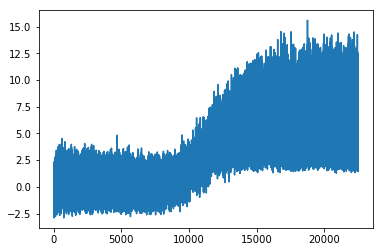

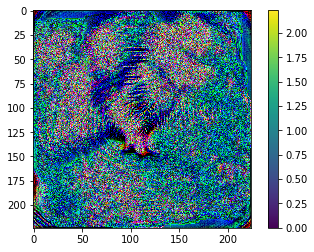

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.077935218811035
333 ( hamster ) pre-softmax-nll-score: 8.077935218811035
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.246967792510986
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 6.338357925415039
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 6.255565643310547
283 ( Persian cat ) pre-softmax-nll-score: 6.083749294281006
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.63059139251709
333 ( hamster ) pre-softmax-nll-score: 10.63059139251709
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.360371112823486
937 ( broccoli ) pre-softmax-nll-score: 7.242210388183594
106 ( wombat ) pre-softmax-nll-score: 6.629302501678467
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 6.576023578643799
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.984155654907227
333 ( hamster ) pre-softmax-nll-score: 13.98415565

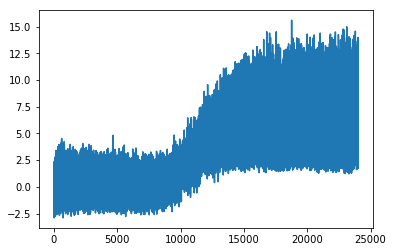

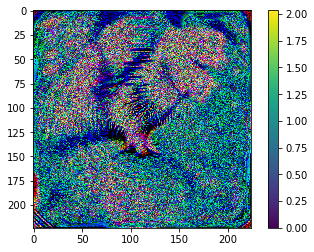

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 6.81131649017334
333 ( hamster ) pre-softmax-nll-score: 6.81131649017334
106 ( wombat ) pre-softmax-nll-score: 6.244812965393066
362 ( badger ) pre-softmax-nll-score: 6.154994010925293
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 6.056114673614502
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 5.962212085723877
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.187687873840332
333 ( hamster ) pre-softmax-nll-score: 12.187687873840332
106 ( wombat ) pre-softmax-nll-score: 8.662995338439941
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.337713241577148
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 8.178597450256348
203 ( West Highland white terrier ) pre-softmax-nll-score: 7.996781349182129
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.998623847961426
333 ( hamster ) pre-softmax-nll-

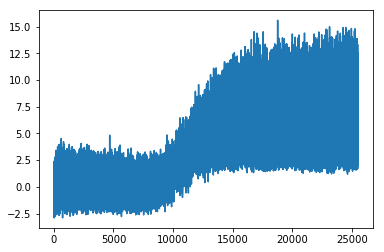

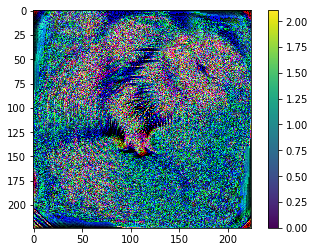

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.718682289123535
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.096181869506836
333 ( hamster ) pre-softmax-nll-score: 8.718682289123535
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.65453052520752
337 ( beaver ) pre-softmax-nll-score: 8.167376518249512
362 ( badger ) pre-softmax-nll-score: 7.250977993011475
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.39725112915039
333 ( hamster ) pre-softmax-nll-score: 15.39725112915039
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.369409561157227
937 ( broccoli ) pre-softmax-nll-score: 10.154708862304688
106 ( wombat ) pre-softmax-nll-score: 9.156291007995605
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 8.026788711547852
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.61626148223877
333 ( hamster ) pre-softmax-nll-score: 14.61626148223

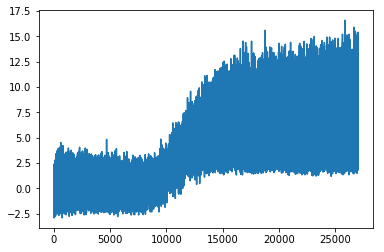

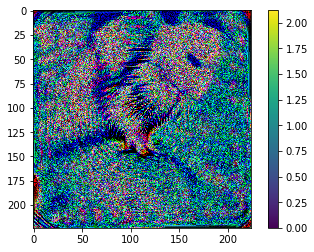

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.136287689208984
333 ( hamster ) pre-softmax-nll-score: 9.136287689208984
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.783849716186523
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.542322158813477
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 8.374666213989258
362 ( badger ) pre-softmax-nll-score: 7.40566873550415
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.26343822479248
333 ( hamster ) pre-softmax-nll-score: 14.26343822479248
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.253902435302734
937 ( broccoli ) pre-softmax-nll-score: 8.604182243347168
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.708483695983887
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.6947832107543945
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.026004791259766
333 ( hamster ) 

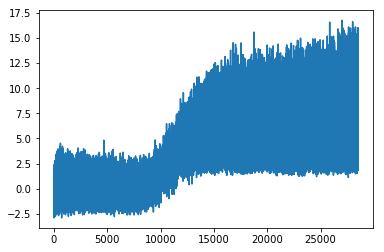

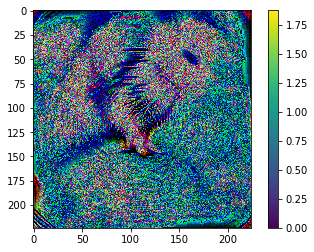

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 6.731545448303223
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.433560848236084
333 ( hamster ) pre-softmax-nll-score: 6.731545448303223
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 6.605809211730957
971 ( bubble ) pre-softmax-nll-score: 6.110901832580566
106 ( wombat ) pre-softmax-nll-score: 5.982607364654541
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.266890525817871
333 ( hamster ) pre-softmax-nll-score: 12.266890525817871
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.902168273925781
879 ( umbrella ) pre-softmax-nll-score: 8.042364120483398
937 ( broccoli ) pre-softmax-nll-score: 7.567416191101074
463 ( bucket, pail ) pre-softmax-nll-score: 7.468834400177002
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.066510200500488
333 ( hamster ) pre-softmax-nll-score: 10.066510200500488
337 ( beaver ) pre-softm

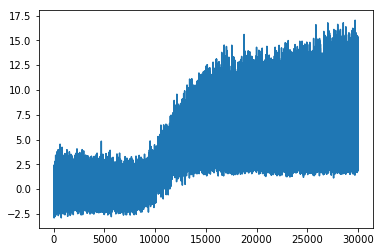

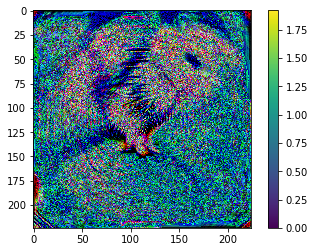

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.195245742797852
333 ( hamster ) pre-softmax-nll-score: 8.195245742797852
331 ( hare ) pre-softmax-nll-score: 7.685728073120117
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.510716915130615
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 6.661271572113037
337 ( beaver ) pre-softmax-nll-score: 6.37589693069458
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.27839183807373
333 ( hamster ) pre-softmax-nll-score: 15.27839183807373
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.54859447479248
937 ( broccoli ) pre-softmax-nll-score: 8.85447883605957
106 ( wombat ) pre-softmax-nll-score: 8.392467498779297
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.7583417892456055
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.039307594299316
333 ( hamster ) pre-softmax-nll-sc

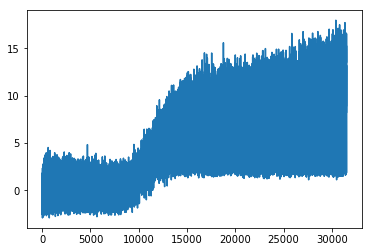

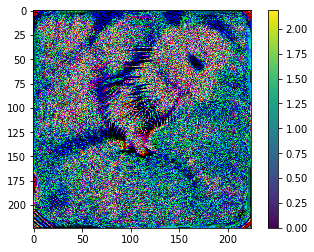

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.169591903686523
333 ( hamster ) pre-softmax-nll-score: 9.169591903686523
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.425837516784668
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.030910491943359
337 ( beaver ) pre-softmax-nll-score: 6.887635231018066
845 ( syringe ) pre-softmax-nll-score: 6.151696681976318
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.281394004821777
333 ( hamster ) pre-softmax-nll-score: 15.281394004821777
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.950227737426758
937 ( broccoli ) pre-softmax-nll-score: 9.768486976623535
106 ( wombat ) pre-softmax-nll-score: 8.349388122558594
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 8.006231307983398
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.577583312988281
333 ( hamster ) pre-softmax-nll-score: 15.577583312988281
338 ( guinea 

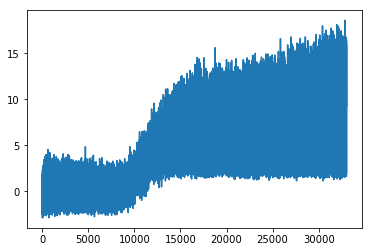

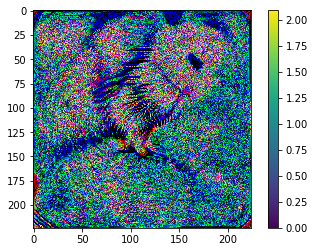

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 5.562504768371582
6 ( stingray ) pre-softmax-nll-score: 7.223396301269531
719 ( piggy bank, penny bank ) pre-softmax-nll-score: 6.727886199951172
971 ( bubble ) pre-softmax-nll-score: 6.428557395935059
677 ( nail ) pre-softmax-nll-score: 6.384140491485596
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 6.21554708480835
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.312639236450195
333 ( hamster ) pre-softmax-nll-score: 11.312639236450195
106 ( wombat ) pre-softmax-nll-score: 8.170572280883789
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.5500688552856445
203 ( West Highland white terrier ) pre-softmax-nll-score: 7.33667516708374
463 ( bucket, pail ) pre-softmax-nll-score: 7.25267219543457
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.176508903503418
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.6566896438598

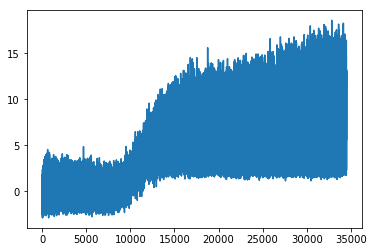

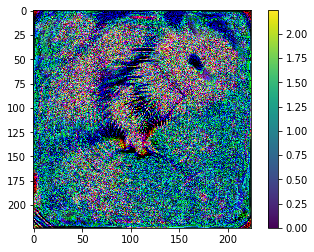

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.506712913513184
333 ( hamster ) pre-softmax-nll-score: 9.506712913513184
337 ( beaver ) pre-softmax-nll-score: 8.815458297729492
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.558769226074219
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.898910045623779
106 ( wombat ) pre-softmax-nll-score: 7.141917705535889
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.239838600158691
333 ( hamster ) pre-softmax-nll-score: 15.239838600158691
937 ( broccoli ) pre-softmax-nll-score: 10.500092506408691
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.382622718811035
106 ( wombat ) pre-softmax-nll-score: 7.727601528167725
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 7.516417503356934
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.26565170288086
333 ( hamster ) pre-softmax-nll-score: 16.26565170288

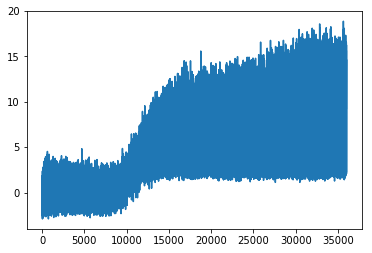

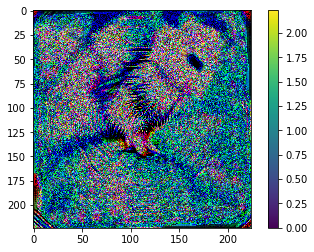

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.977425575256348
333 ( hamster ) pre-softmax-nll-score: 8.977425575256348
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 6.035412311553955
331 ( hare ) pre-softmax-nll-score: 5.469657897949219
850 ( teddy, teddy bear ) pre-softmax-nll-score: 5.463654041290283
283 ( Persian cat ) pre-softmax-nll-score: 5.418687343597412
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.859824180603027
333 ( hamster ) pre-softmax-nll-score: 15.859824180603027
937 ( broccoli ) pre-softmax-nll-score: 11.17330551147461
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.543379783630371
106 ( wombat ) pre-softmax-nll-score: 7.511080265045166
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.205929756164551
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.615160942077637
333 ( hamster ) pre-softmax-nll-score: 15.615160942077637
331 ( hare ) p

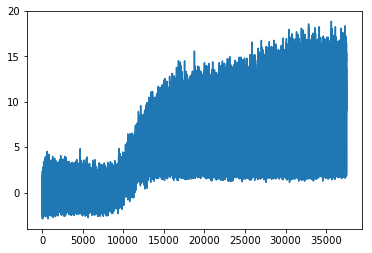

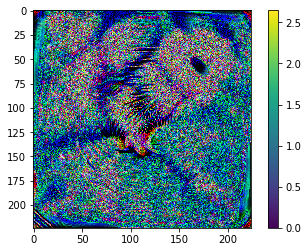

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.61384105682373
333 ( hamster ) pre-softmax-nll-score: 10.61384105682373
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.374419212341309
719 ( piggy bank, penny bank ) pre-softmax-nll-score: 8.951155662536621
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 7.581986427307129
331 ( hare ) pre-softmax-nll-score: 7.510772228240967
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.783008575439453
333 ( hamster ) pre-softmax-nll-score: 17.783008575439453
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.670270919799805
937 ( broccoli ) pre-softmax-nll-score: 10.66658878326416
106 ( wombat ) pre-softmax-nll-score: 9.413778305053711
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 8.774782180786133
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.096711158752441
333 ( hamste

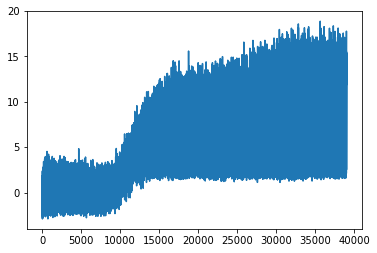

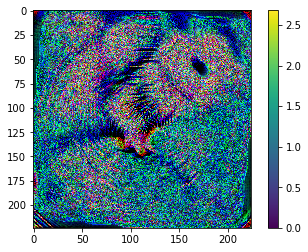

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.522568702697754
333 ( hamster ) pre-softmax-nll-score: 9.522568702697754
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.49130916595459
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.457358360290527
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 7.217865467071533
337 ( beaver ) pre-softmax-nll-score: 7.1951823234558105
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.630845069885254
333 ( hamster ) pre-softmax-nll-score: 11.630845069885254
937 ( broccoli ) pre-softmax-nll-score: 9.311981201171875
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 8.211730003356934
973 ( coral reef ) pre-softmax-nll-score: 7.213069915771484
393 ( anemone fish ) pre-softmax-nll-score: 7.1338300704956055
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.091910362243652
333 ( hamster ) pre-softmax-nll-score: 14.091910362243652
10

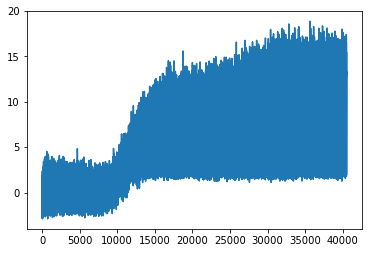

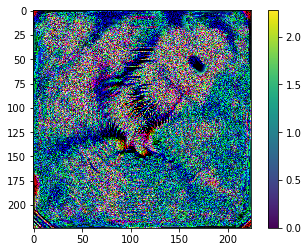

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.545557975769043
333 ( hamster ) pre-softmax-nll-score: 11.545557975769043
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 9.016725540161133
337 ( beaver ) pre-softmax-nll-score: 8.619026184082031
106 ( wombat ) pre-softmax-nll-score: 8.018963813781738
356 ( weasel ) pre-softmax-nll-score: 7.4338250160217285
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.359541893005371
333 ( hamster ) pre-softmax-nll-score: 15.359541893005371
937 ( broccoli ) pre-softmax-nll-score: 10.16262435913086
106 ( wombat ) pre-softmax-nll-score: 8.611492156982422
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.578422546386719
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.711784362792969
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.034697532653809
333 ( hamster ) pre-softmax-nll-score: 14.034697532653809
331 ( ha

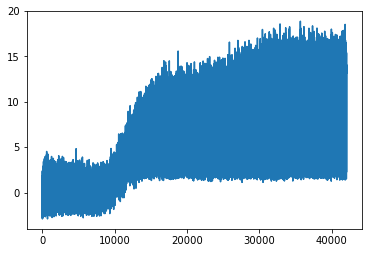

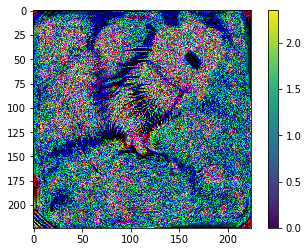

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.580094337463379
333 ( hamster ) pre-softmax-nll-score: 9.580094337463379
337 ( beaver ) pre-softmax-nll-score: 8.689521789550781
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.964742183685303
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 6.93930196762085
336 ( marmot ) pre-softmax-nll-score: 6.833197116851807
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.016130447387695
333 ( hamster ) pre-softmax-nll-score: 14.016130447387695
937 ( broccoli ) pre-softmax-nll-score: 9.438203811645508
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.995851516723633
106 ( wombat ) pre-softmax-nll-score: 7.762789726257324
971 ( bubble ) pre-softmax-nll-score: 6.469976425170898
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.105911254882812
333 ( hamster ) pre-softmax-nll-score: 14.105911254882812
338 ( guinea pig, Cavia cobaya ) 

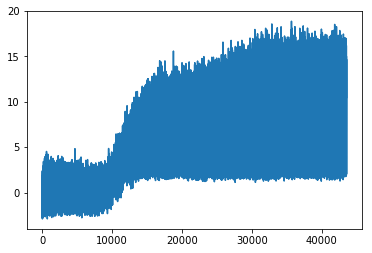

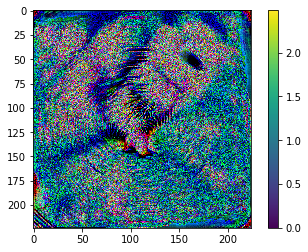

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.891194343566895
333 ( hamster ) pre-softmax-nll-score: 11.891194343566895
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.163487434387207
283 ( Persian cat ) pre-softmax-nll-score: 8.306120872497559
331 ( hare ) pre-softmax-nll-score: 7.7684326171875
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.699038028717041
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.338586807250977
333 ( hamster ) pre-softmax-nll-score: 16.338586807250977
937 ( broccoli ) pre-softmax-nll-score: 11.688763618469238
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.405834197998047
106 ( wombat ) pre-softmax-nll-score: 8.773237228393555
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.069231986999512
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.654729843139648
333 ( hamster ) pre-softmax-nll-score: 13.6547298

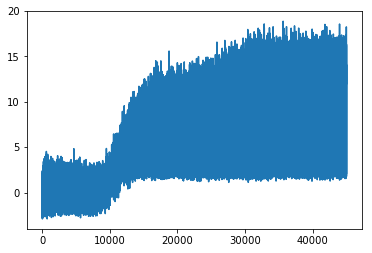

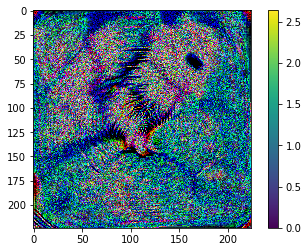

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.957382202148438
333 ( hamster ) pre-softmax-nll-score: 10.957382202148438
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.608623504638672
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.578836441040039
337 ( beaver ) pre-softmax-nll-score: 7.339560031890869
463 ( bucket, pail ) pre-softmax-nll-score: 6.404924392700195
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.430658340454102
333 ( hamster ) pre-softmax-nll-score: 14.430658340454102
937 ( broccoli ) pre-softmax-nll-score: 10.114893913269043
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.502647399902344
106 ( wombat ) pre-softmax-nll-score: 8.020208358764648
971 ( bubble ) pre-softmax-nll-score: 7.764426231384277
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.144791603088379
333 ( hamster ) pre-softmax-nll-score: 13.144791603088379
332 ( Angora, Angora ra

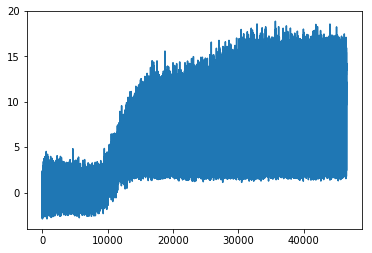

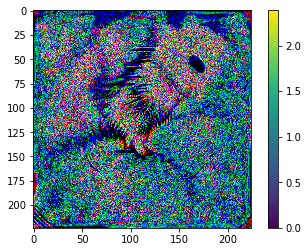

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.841681480407715
333 ( hamster ) pre-softmax-nll-score: 8.841681480407715
331 ( hare ) pre-softmax-nll-score: 7.268517971038818
6 ( stingray ) pre-softmax-nll-score: 6.95504903793335
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 6.903275966644287
719 ( piggy bank, penny bank ) pre-softmax-nll-score: 6.837123870849609
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.477385520935059
333 ( hamster ) pre-softmax-nll-score: 13.477385520935059
937 ( broccoli ) pre-softmax-nll-score: 9.614482879638672
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.904926300048828
260 ( chow, chow chow ) pre-softmax-nll-score: 7.1280083656311035
463 ( bucket, pail ) pre-softmax-nll-score: 7.126699447631836
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.652815818786621
333 ( hamster ) pre-softmax-nll-score: 13.652815818786621
338 ( guinea pig

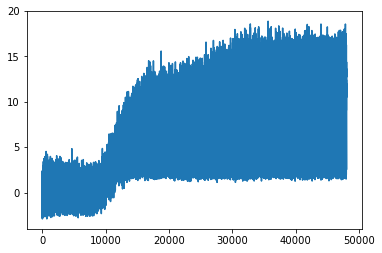

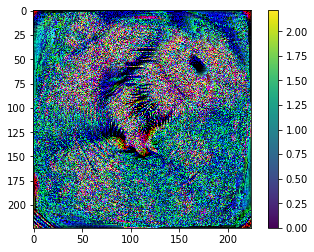

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.188923835754395
333 ( hamster ) pre-softmax-nll-score: 8.188923835754395
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.5333356857299805
971 ( bubble ) pre-softmax-nll-score: 7.0023112297058105
845 ( syringe ) pre-softmax-nll-score: 6.704291820526123
611 ( jigsaw puzzle ) pre-softmax-nll-score: 6.126914978027344
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.362515449523926
333 ( hamster ) pre-softmax-nll-score: 10.362515449523926
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.333593368530273
6 ( stingray ) pre-softmax-nll-score: 7.620182991027832
937 ( broccoli ) pre-softmax-nll-score: 7.068980693817139
201 ( silky terrier, Sydney silky ) pre-softmax-nll-score: 6.84273624420166
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.879289627075195
333 ( hamster ) pre-softmax-nll-score: 13.879289627075195
338 ( guinea pi

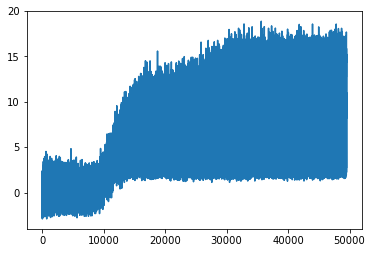

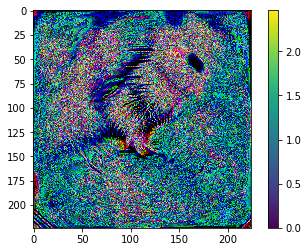

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.705021858215332
333 ( hamster ) pre-softmax-nll-score: 10.705021858215332
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.8772611618042
337 ( beaver ) pre-softmax-nll-score: 7.6921916007995605
674 ( mousetrap ) pre-softmax-nll-score: 6.629465579986572
719 ( piggy bank, penny bank ) pre-softmax-nll-score: 6.493210792541504
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.321423530578613
333 ( hamster ) pre-softmax-nll-score: 15.321423530578613
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.160327911376953
937 ( broccoli ) pre-softmax-nll-score: 9.189093589782715
106 ( wombat ) pre-softmax-nll-score: 8.370284080505371
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.075153827667236
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.398566246032715
333 ( hamster ) pre-softmax-nll-score: 15.398566246032715
338 ( g

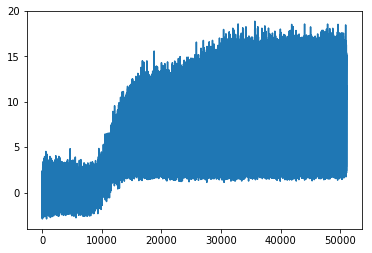

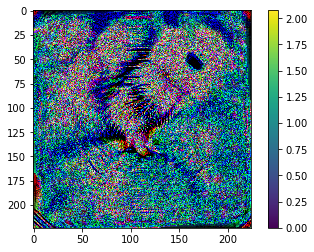

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.92086410522461
333 ( hamster ) pre-softmax-nll-score: 11.92086410522461
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.113424301147461
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 9.046446800231934
337 ( beaver ) pre-softmax-nll-score: 8.677536010742188
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 8.158124923706055
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.24031639099121
333 ( hamster ) pre-softmax-nll-score: 16.24031639099121
937 ( broccoli ) pre-softmax-nll-score: 10.274500846862793
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.126107215881348
106 ( wombat ) pre-softmax-nll-score: 7.982898712158203
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.193662643432617
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.25269317626953
333 ( hamster ) pre-softmax-nll-

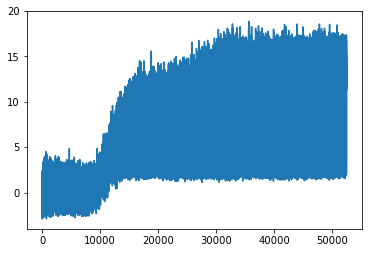

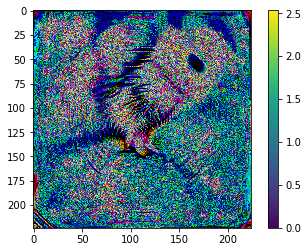

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.124335289001465
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.564680099487305
333 ( hamster ) pre-softmax-nll-score: 10.124335289001465
719 ( piggy bank, penny bank ) pre-softmax-nll-score: 8.40604305267334
337 ( beaver ) pre-softmax-nll-score: 8.091355323791504
463 ( bucket, pail ) pre-softmax-nll-score: 7.678953647613525
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.221695899963379
333 ( hamster ) pre-softmax-nll-score: 15.221695899963379
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.049466133117676
937 ( broccoli ) pre-softmax-nll-score: 9.717336654663086
463 ( bucket, pail ) pre-softmax-nll-score: 9.081140518188477
106 ( wombat ) pre-softmax-nll-score: 8.014391899108887
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.774986267089844
333 ( hamster ) pre-softmax-nll-score: 14.774986267089844
338 ( guinea p

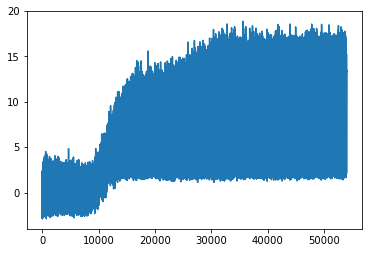

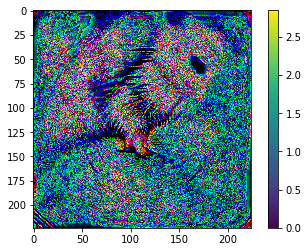

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.333420753479004
337 ( beaver ) pre-softmax-nll-score: 9.276774406433105
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.06523323059082
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.866606712341309
333 ( hamster ) pre-softmax-nll-score: 8.333420753479004
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 6.972523212432861
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.782809257507324
333 ( hamster ) pre-softmax-nll-score: 12.782809257507324
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.974020481109619
937 ( broccoli ) pre-softmax-nll-score: 7.926968097686768
392 ( rock beauty, Holocanthus tricolor ) pre-softmax-nll-score: 7.78849983215332
390 ( eel ) pre-softmax-nll-score: 7.766213893890381
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.382674217224121
333 ( hamster ) pre-softmax-nll-score: 15.382674

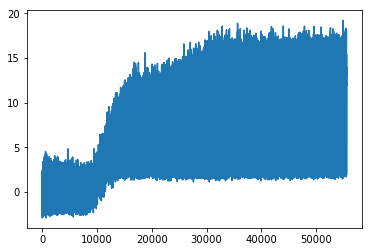

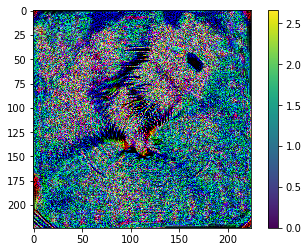

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.24703598022461
333 ( hamster ) pre-softmax-nll-score: 10.24703598022461
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.724764823913574
337 ( beaver ) pre-softmax-nll-score: 8.247838020324707
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.932661533355713
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 7.167862415313721
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.305532455444336
333 ( hamster ) pre-softmax-nll-score: 17.305532455444336
937 ( broccoli ) pre-softmax-nll-score: 12.631433486938477
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.934847831726074
106 ( wombat ) pre-softmax-nll-score: 9.022112846374512
463 ( bucket, pail ) pre-softmax-nll-score: 8.796420097351074
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.695389747619629
333 ( hamster ) pre-softmax-nll-score: 13.69538

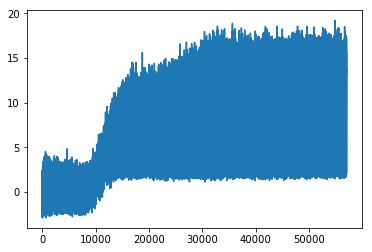

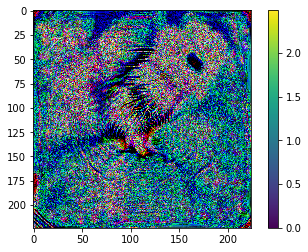

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.06061840057373
333 ( hamster ) pre-softmax-nll-score: 11.06061840057373
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.793760776519775
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.7448506355285645
283 ( Persian cat ) pre-softmax-nll-score: 7.663184642791748
337 ( beaver ) pre-softmax-nll-score: 7.139557361602783
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.925833702087402
333 ( hamster ) pre-softmax-nll-score: 14.925833702087402
937 ( broccoli ) pre-softmax-nll-score: 10.805851936340332
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 7.487479209899902
106 ( wombat ) pre-softmax-nll-score: 7.268744945526123
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.241937637329102
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.13283920288086
333 ( hamster ) pre-softmax-nll-score: 15.132839

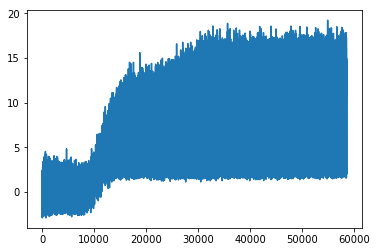

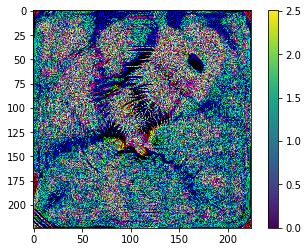

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.409144401550293
333 ( hamster ) pre-softmax-nll-score: 11.409144401550293
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.477324485778809
337 ( beaver ) pre-softmax-nll-score: 8.140921592712402
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.854613304138184
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 7.087623119354248
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.328872680664062
333 ( hamster ) pre-softmax-nll-score: 16.328872680664062
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.698970794677734
937 ( broccoli ) pre-softmax-nll-score: 10.467986106872559
332 ( Angora, Angora rabbit ) pre-softmax-nll-score: 8.51856517791748
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.514540672302246
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.152631759643555
333 ( hamster ) pre-softmax-nll-score: 

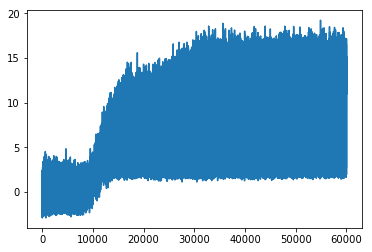

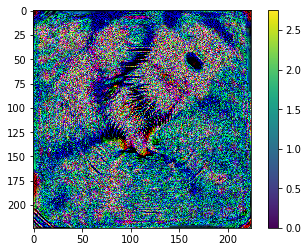

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.985045433044434
333 ( hamster ) pre-softmax-nll-score: 11.985045433044434
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.569968223571777
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.407186508178711
337 ( beaver ) pre-softmax-nll-score: 7.397791385650635
674 ( mousetrap ) pre-softmax-nll-score: 6.828198432922363
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.78759479522705
333 ( hamster ) pre-softmax-nll-score: 14.78759479522705
937 ( broccoli ) pre-softmax-nll-score: 10.376891136169434
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.436849594116211
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 8.241903305053711
392 ( rock beauty, Holocanthus tricolor ) pre-softmax-nll-score: 7.74151086807251
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.207568168640137
333 ( hamster ) pre-softmax-nll-score: 15.2

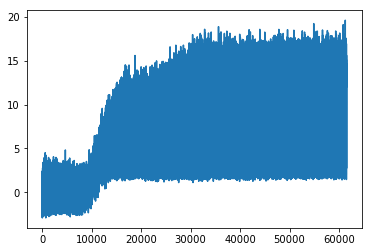

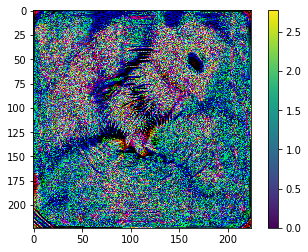

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.9822416305542
333 ( hamster ) pre-softmax-nll-score: 11.9822416305542
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.866262435913086
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.64789342880249
283 ( Persian cat ) pre-softmax-nll-score: 7.507450103759766
332 ( Angora, Angora rabbit ) pre-softmax-nll-score: 7.474485874176025
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.139005661010742
333 ( hamster ) pre-softmax-nll-score: 16.139005661010742
937 ( broccoli ) pre-softmax-nll-score: 11.584750175476074
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.696545600891113
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.017666816711426
106 ( wombat ) pre-softmax-nll-score: 7.663437366485596
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.78173542022705
333 ( hamster ) pre-softmax-nll-scor

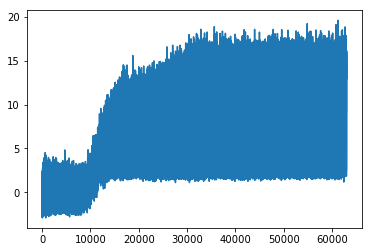

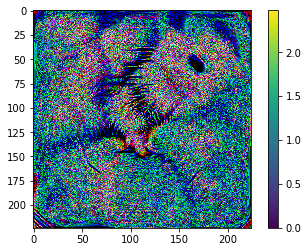

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.232904434204102
333 ( hamster ) pre-softmax-nll-score: 10.232904434204102
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.38019847869873
337 ( beaver ) pre-softmax-nll-score: 8.710391998291016
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.538311004638672
362 ( badger ) pre-softmax-nll-score: 7.587837219238281
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.957592010498047
333 ( hamster ) pre-softmax-nll-score: 14.957592010498047
937 ( broccoli ) pre-softmax-nll-score: 10.127260208129883
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.190319061279297
106 ( wombat ) pre-softmax-nll-score: 8.863082885742188
463 ( bucket, pail ) pre-softmax-nll-score: 7.6409831047058105
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.996356010437012
333 ( hamster ) pre-softmax-nll-score: 13.996356010437012
338 ( guinea pig, Cavia

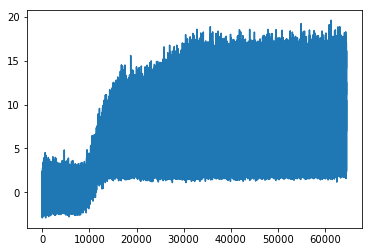

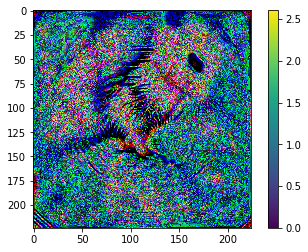

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.82658576965332
333 ( hamster ) pre-softmax-nll-score: 11.82658576965332
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.788804054260254
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.964062690734863
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.111120223999023
331 ( hare ) pre-softmax-nll-score: 7.866024017333984
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.889360427856445
333 ( hamster ) pre-softmax-nll-score: 16.889360427856445
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.58716869354248
106 ( wombat ) pre-softmax-nll-score: 10.018087387084961
937 ( broccoli ) pre-softmax-nll-score: 9.739717483520508
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 9.61723804473877
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.54402732849121
333 ( hamster ) pr

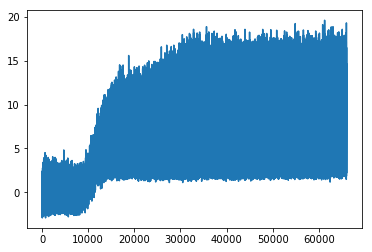

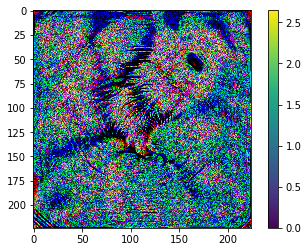

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.66090202331543
333 ( hamster ) pre-softmax-nll-score: 11.66090202331543
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.399970054626465
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 9.708597183227539
337 ( beaver ) pre-softmax-nll-score: 9.413662910461426
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.647866249084473
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.365981101989746
333 ( hamster ) pre-softmax-nll-score: 15.365981101989746
937 ( broccoli ) pre-softmax-nll-score: 10.82302188873291
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.190839767456055
392 ( rock beauty, Holocanthus tricolor ) pre-softmax-nll-score: 7.950311660766602
106 ( wombat ) pre-softmax-nll-score: 7.771706581115723
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.435564994812012
333 ( hamster ) pre-softma

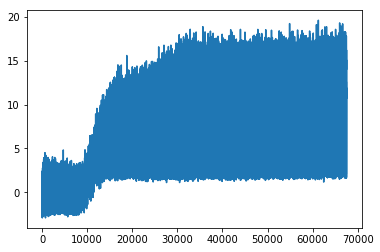

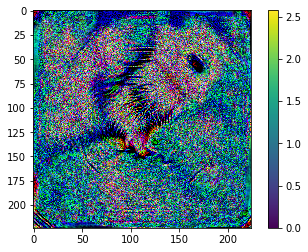

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.298131942749023
333 ( hamster ) pre-softmax-nll-score: 14.298131942749023
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.864680290222168
337 ( beaver ) pre-softmax-nll-score: 11.446359634399414
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 10.232562065124512
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 9.507905960083008
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.062049865722656
333 ( hamster ) pre-softmax-nll-score: 16.062049865722656
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 12.010764122009277
937 ( broccoli ) pre-softmax-nll-score: 10.483321189880371
106 ( wombat ) pre-softmax-nll-score: 9.513069152832031
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 9.071439743041992
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.855682373046875
333 ( hamst

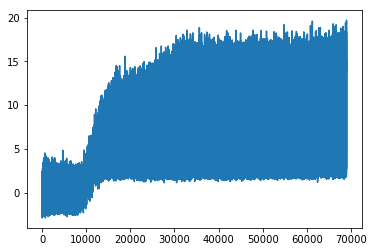

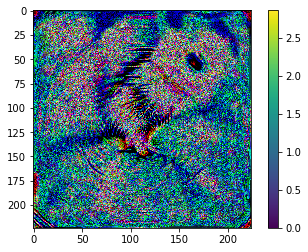

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.79471206665039
333 ( hamster ) pre-softmax-nll-score: 10.79471206665039
337 ( beaver ) pre-softmax-nll-score: 9.451753616333008
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.820340156555176
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.135068893432617
331 ( hare ) pre-softmax-nll-score: 7.230809211730957
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.928008079528809
333 ( hamster ) pre-softmax-nll-score: 15.928008079528809
937 ( broccoli ) pre-softmax-nll-score: 10.580997467041016
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.003630638122559
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.80061149597168
336 ( marmot ) pre-softmax-nll-score: 7.949839115142822
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.602055549621582
333 ( hamster ) pre-softmax-nll-score: 14.602055549621582
338 ( guinea pig, Ca

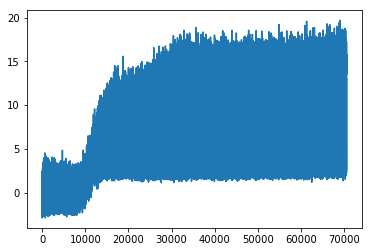

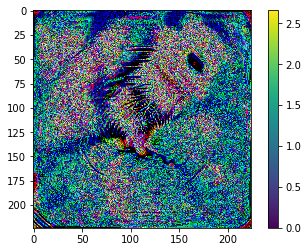

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.49249267578125
333 ( hamster ) pre-softmax-nll-score: 12.49249267578125
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.988029479980469
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.370865821838379
337 ( beaver ) pre-softmax-nll-score: 8.243152618408203
331 ( hare ) pre-softmax-nll-score: 7.246821403503418
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.514415740966797
333 ( hamster ) pre-softmax-nll-score: 13.514415740966797
937 ( broccoli ) pre-softmax-nll-score: 9.077971458435059
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 6.956298828125
106 ( wombat ) pre-softmax-nll-score: 6.455022811889648
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 6.4437408447265625
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.392507553100586
333 ( hamster ) pre-softmax-nll-score: 17.392507553100586
338 ( guinea pig, C

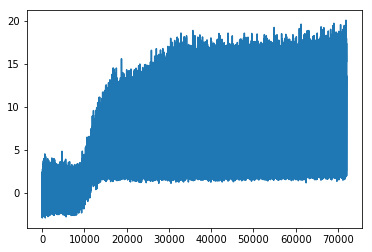

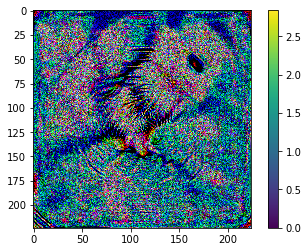

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.052591323852539
333 ( hamster ) pre-softmax-nll-score: 11.052591323852539
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.342371940612793
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.946259498596191
331 ( hare ) pre-softmax-nll-score: 8.821564674377441
337 ( beaver ) pre-softmax-nll-score: 8.024043083190918
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.17636775970459
333 ( hamster ) pre-softmax-nll-score: 15.17636775970459
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.813851356506348
106 ( wombat ) pre-softmax-nll-score: 8.834012031555176
937 ( broccoli ) pre-softmax-nll-score: 8.82531452178955
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.699001789093018
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.124373435974121
333 ( hamster ) pre-softmax-nl

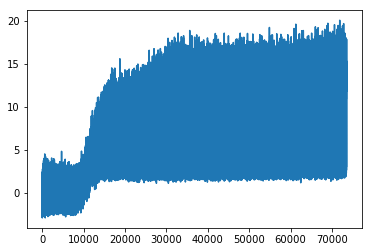

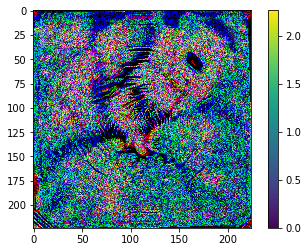

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.471571922302246
333 ( hamster ) pre-softmax-nll-score: 11.471571922302246
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.643003463745117
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.812158107757568
337 ( beaver ) pre-softmax-nll-score: 7.410713195800781
283 ( Persian cat ) pre-softmax-nll-score: 7.239062309265137
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.038291931152344
333 ( hamster ) pre-softmax-nll-score: 15.038291931152344
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.868476867675781
937 ( broccoli ) pre-softmax-nll-score: 10.05422306060791
106 ( wombat ) pre-softmax-nll-score: 7.341954231262207
971 ( bubble ) pre-softmax-nll-score: 6.707614898681641
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.707295417785645
333 ( hamster ) pre-softmax-nll-score: 15.707295417785645
338 ( guinea pig, Cavia 

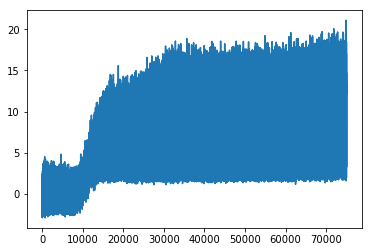

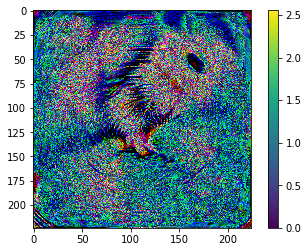

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.166210174560547
333 ( hamster ) pre-softmax-nll-score: 12.166210174560547
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.23652458190918
337 ( beaver ) pre-softmax-nll-score: 8.929853439331055
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.6638970375061035
377 ( marmoset ) pre-softmax-nll-score: 7.528973579406738
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.304119110107422
333 ( hamster ) pre-softmax-nll-score: 16.304119110107422
937 ( broccoli ) pre-softmax-nll-score: 11.440275192260742
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.95091438293457
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 9.343395233154297
332 ( Angora, Angora rabbit ) pre-softmax-nll-score: 8.138394355773926
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.794936180114746
333 ( hamster ) pre-softmax-nll-sc

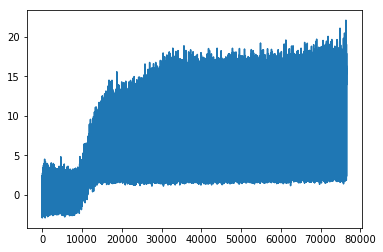

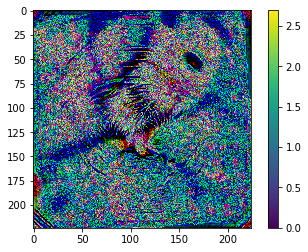

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.616992950439453
333 ( hamster ) pre-softmax-nll-score: 10.616992950439453
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 10.054420471191406
337 ( beaver ) pre-softmax-nll-score: 9.115413665771484
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.6119384765625
674 ( mousetrap ) pre-softmax-nll-score: 7.605756759643555
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.437715530395508
333 ( hamster ) pre-softmax-nll-score: 15.437715530395508
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.924479484558105
937 ( broccoli ) pre-softmax-nll-score: 9.879822731018066
106 ( wombat ) pre-softmax-nll-score: 8.968223571777344
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 8.230133056640625
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.93928337097168
333 ( hamster ) pre-softmax-nll-score: 16.939283

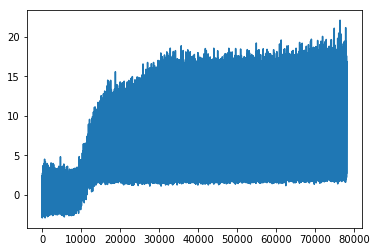

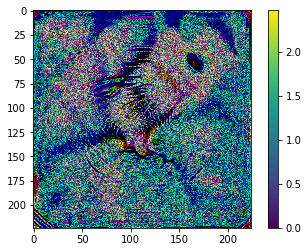

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.004925727844238
333 ( hamster ) pre-softmax-nll-score: 11.004925727844238
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.568236351013184
337 ( beaver ) pre-softmax-nll-score: 7.88355827331543
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.514946460723877
674 ( mousetrap ) pre-softmax-nll-score: 6.910589218139648
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.526168823242188
333 ( hamster ) pre-softmax-nll-score: 14.526168823242188
937 ( broccoli ) pre-softmax-nll-score: 8.895133972167969
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.880866050720215
106 ( wombat ) pre-softmax-nll-score: 6.961498260498047
741 ( prayer rug, prayer mat ) pre-softmax-nll-score: 6.1623382568359375
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.977380752563477
333 ( hamster ) pre-softmax-nll-score: 15.977380752563477
338 ( guine

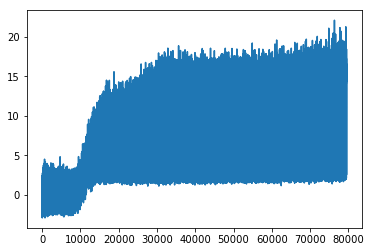

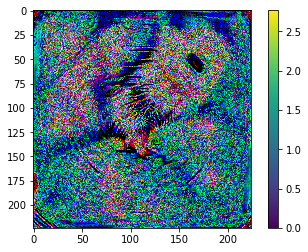

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.715720176696777
333 ( hamster ) pre-softmax-nll-score: 12.715720176696777
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.815044403076172
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.384234428405762
337 ( beaver ) pre-softmax-nll-score: 8.126893997192383
361 ( skunk, polecat, wood pussy ) pre-softmax-nll-score: 7.950361728668213
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.173266410827637
333 ( hamster ) pre-softmax-nll-score: 13.173266410827637
937 ( broccoli ) pre-softmax-nll-score: 8.614818572998047
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.533947944641113
106 ( wombat ) pre-softmax-nll-score: 7.203546047210693
110 ( flatworm, platyhelminth ) pre-softmax-nll-score: 7.0306572914123535
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.181655883789062
333 ( hamster ) pre-softmax-nll-score: 15.18165588

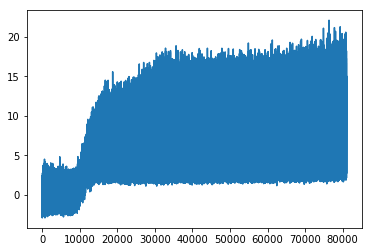

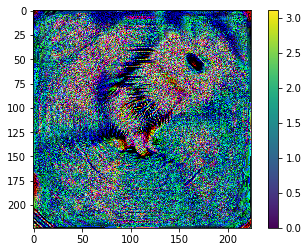

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 9.802350044250488
333 ( hamster ) pre-softmax-nll-score: 9.802350044250488
328 ( sea urchin ) pre-softmax-nll-score: 9.401945114135742
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.493139266967773
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.726468563079834
337 ( beaver ) pre-softmax-nll-score: 6.899302005767822
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.068405151367188
333 ( hamster ) pre-softmax-nll-score: 17.068405151367188
937 ( broccoli ) pre-softmax-nll-score: 11.89867877960205
106 ( wombat ) pre-softmax-nll-score: 10.06839656829834
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.942840576171875
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 9.629703521728516
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.864681243896484
333 ( hamster ) pre-softmax-nll-score: 17.86468124

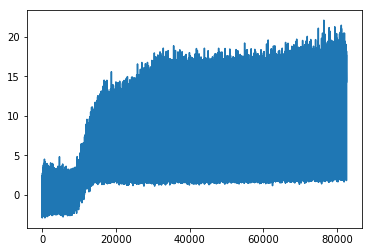

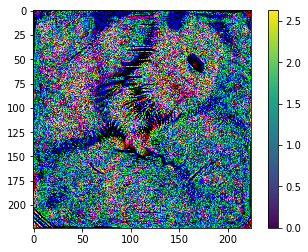

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.876992225646973
333 ( hamster ) pre-softmax-nll-score: 10.876992225646973
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.674875259399414
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.165370464324951
937 ( broccoli ) pre-softmax-nll-score: 7.136565685272217
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 6.744387149810791
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.292804718017578
333 ( hamster ) pre-softmax-nll-score: 14.292804718017578
937 ( broccoli ) pre-softmax-nll-score: 9.855541229248047
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.909464836120605
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.812552452087402
331 ( hare ) pre-softmax-nll-score: 7.433052062988281
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.662216186523438
333 ( hamster ) 

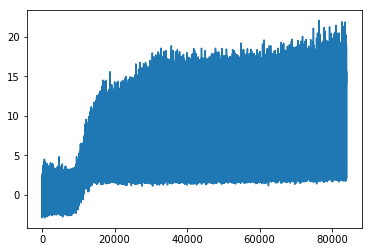

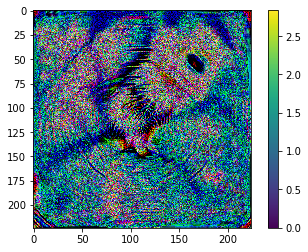

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.10370922088623
333 ( hamster ) pre-softmax-nll-score: 11.10370922088623
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.138916015625
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.6170268058776855
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 6.636353969573975
937 ( broccoli ) pre-softmax-nll-score: 6.618370532989502
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.02151107788086
333 ( hamster ) pre-softmax-nll-score: 16.02151107788086
937 ( broccoli ) pre-softmax-nll-score: 10.721847534179688
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.206669807434082
106 ( wombat ) pre-softmax-nll-score: 7.596200466156006
359 ( black-footed ferret, ferret, Mustela nigripes ) pre-softmax-nll-score: 7.1427741050720215
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.92107582092285
333 ( hamster )

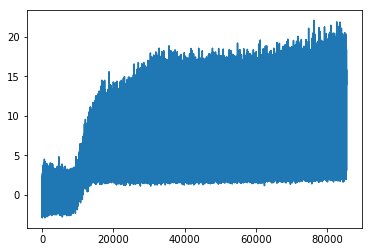

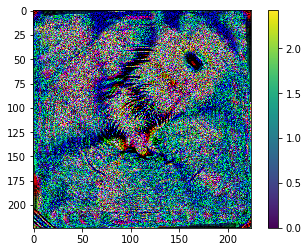

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 8.210929870605469
333 ( hamster ) pre-softmax-nll-score: 8.210929870605469
850 ( teddy, teddy bear ) pre-softmax-nll-score: 6.707547187805176
677 ( nail ) pre-softmax-nll-score: 6.665247440338135
328 ( sea urchin ) pre-softmax-nll-score: 6.1123785972595215
845 ( syringe ) pre-softmax-nll-score: 6.091804504394531
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.64635181427002
333 ( hamster ) pre-softmax-nll-score: 15.64635181427002
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.522507667541504
937 ( broccoli ) pre-softmax-nll-score: 10.058869361877441
106 ( wombat ) pre-softmax-nll-score: 8.584134101867676
356 ( weasel ) pre-softmax-nll-score: 7.198868274688721
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.737812042236328
333 ( hamster ) pre-softmax-nll-score: 16.737812042236328
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll

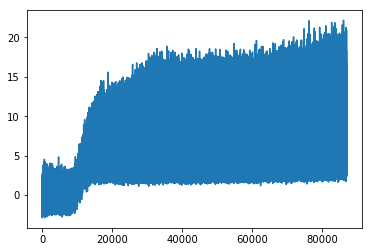

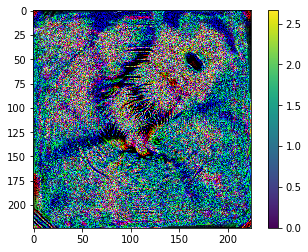

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.42066478729248
333 ( hamster ) pre-softmax-nll-score: 13.42066478729248
337 ( beaver ) pre-softmax-nll-score: 9.716302871704102
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.029854774475098
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 9.014524459838867
356 ( weasel ) pre-softmax-nll-score: 8.69155216217041
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.29801368713379
333 ( hamster ) pre-softmax-nll-score: 16.29801368713379
937 ( broccoli ) pre-softmax-nll-score: 10.997394561767578
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.351512908935547
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 9.079855918884277
106 ( wombat ) pre-softmax-nll-score: 9.030203819274902
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.0757999420166
333 ( hamster ) pre-softmax-nll-score: 17.0757999420166
33

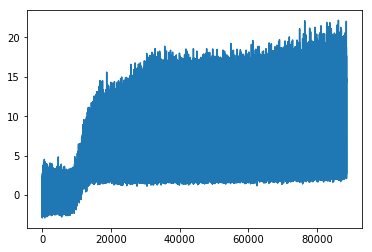

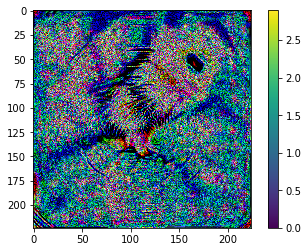

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.549795150756836
333 ( hamster ) pre-softmax-nll-score: 10.549795150756836
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.406588554382324
337 ( beaver ) pre-softmax-nll-score: 8.146269798278809
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.140461921691895
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.785543918609619
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.288922309875488
333 ( hamster ) pre-softmax-nll-score: 15.288922309875488
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 10.369974136352539
937 ( broccoli ) pre-softmax-nll-score: 9.649076461791992
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.088419914245605
674 ( mousetrap ) pre-softmax-nll-score: 7.90025520324707
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.46054744720459
333 ( hamster 

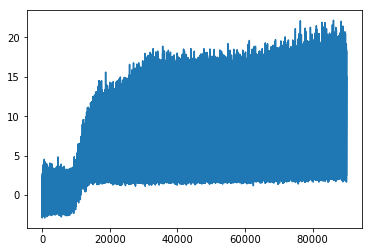

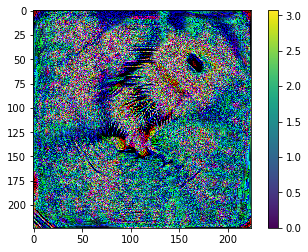

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 10.949994087219238
333 ( hamster ) pre-softmax-nll-score: 10.949994087219238
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.84419059753418
463 ( bucket, pail ) pre-softmax-nll-score: 8.545116424560547
337 ( beaver ) pre-softmax-nll-score: 8.338088989257812
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.041497230529785
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.2328462600708
333 ( hamster ) pre-softmax-nll-score: 14.2328462600708
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.2156343460083
937 ( broccoli ) pre-softmax-nll-score: 9.01815414428711
5 ( electric ray, crampfish, numbfish, torpedo ) pre-softmax-nll-score: 8.153512954711914
390 ( eel ) pre-softmax-nll-score: 8.15151309967041
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.774937629699707
333 ( hamster ) pre-softmax-nll-score: 12.774937629699707
33

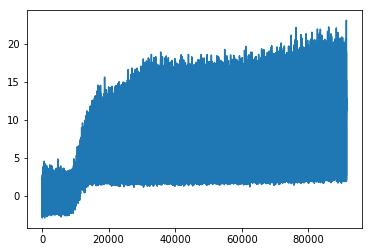

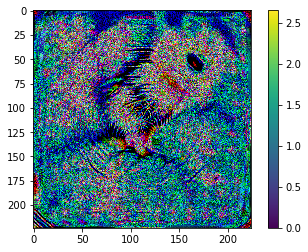

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 13.051898002624512
333 ( hamster ) pre-softmax-nll-score: 13.051898002624512
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.78795051574707
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.19505500793457
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 7.763058185577393
937 ( broccoli ) pre-softmax-nll-score: 7.552890300750732
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 17.356592178344727
333 ( hamster ) pre-softmax-nll-score: 17.356592178344727
937 ( broccoli ) pre-softmax-nll-score: 10.57104778289795
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.436113357543945
106 ( wombat ) pre-softmax-nll-score: 8.7974853515625
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.517292976379395
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.454010009765625
333 ( hamster ) pr

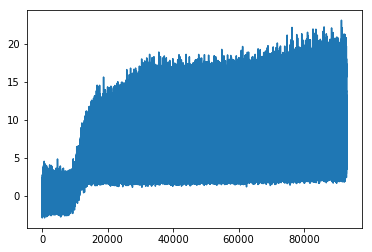

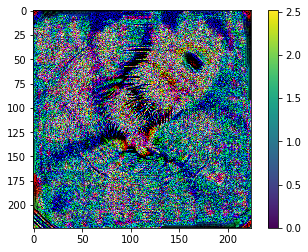

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.618636131286621
333 ( hamster ) pre-softmax-nll-score: 11.618636131286621
337 ( beaver ) pre-softmax-nll-score: 8.947421073913574
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.664434432983398
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.659307479858398
336 ( marmot ) pre-softmax-nll-score: 7.668786525726318
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 15.394296646118164
333 ( hamster ) pre-softmax-nll-score: 15.394296646118164
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.528432846069336
937 ( broccoli ) pre-softmax-nll-score: 9.103812217712402
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 7.642131805419922
332 ( Angora, Angora rabbit ) pre-softmax-nll-score: 7.302061080932617
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 18.028301239013672
333 ( hamster ) pre-softmax-nll-score

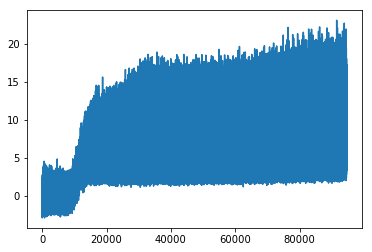

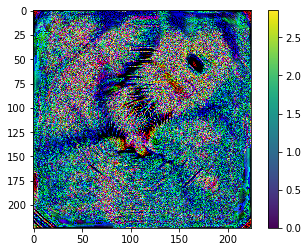

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 11.117182731628418
333 ( hamster ) pre-softmax-nll-score: 11.117182731628418
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 8.170530319213867
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 7.885676383972168
463 ( bucket, pail ) pre-softmax-nll-score: 7.503081798553467
328 ( sea urchin ) pre-softmax-nll-score: 7.317603588104248
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.103421211242676
333 ( hamster ) pre-softmax-nll-score: 14.103421211242676
937 ( broccoli ) pre-softmax-nll-score: 9.99124526977539
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 8.078279495239258
850 ( teddy, teddy bear ) pre-softmax-nll-score: 7.1282782554626465
106 ( wombat ) pre-softmax-nll-score: 6.7598652839660645
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 14.49887466430664
333 ( hamster ) pre-softmax-nll-score: 14.49887466430664
338 ( guin

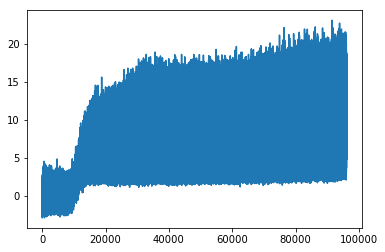

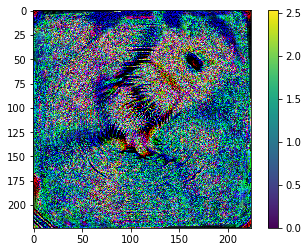

<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 12.657115936279297
333 ( hamster ) pre-softmax-nll-score: 12.657115936279297
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 11.007306098937988
334 ( porcupine, hedgehog ) pre-softmax-nll-score: 9.48644733428955
337 ( beaver ) pre-softmax-nll-score: 9.317570686340332
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.549802780151367
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.474111557006836
333 ( hamster ) pre-softmax-nll-score: 16.474111557006836
937 ( broccoli ) pre-softmax-nll-score: 9.499702453613281
338 ( guinea pig, Cavia cobaya ) pre-softmax-nll-score: 9.242794036865234
330 ( wood rabbit, cottontail, cottontail rabbit ) pre-softmax-nll-score: 8.591008186340332
463 ( bucket, pail ) pre-softmax-nll-score: 8.519298553466797
<class 'torchvision.models.resnet.ResNet'>
pre-softmax-nll-score for: hamster : 16.09872055053711
333 ( hamst

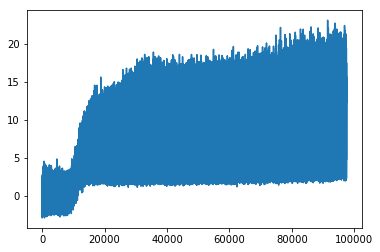

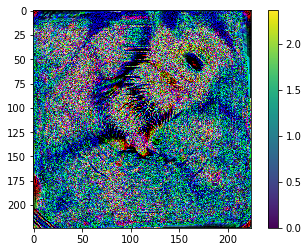

In [ ]:
gray_update = visualize(models_archs, 333)